In [1]:
#pip install planttraits

In [2]:
#pip install statsmodels

In [3]:
from planttraits.datasets.plant_traits_dataset import PlantTraitsDataset

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot

from scipy.stats import skew, kurtosis

In [4]:
train_dataset = PlantTraitsDataset(is_train=True)
test_dataset = PlantTraitsDataset(is_train=False)

In [5]:
train_data = pd.read_csv('../data/train.csv')
test_data = pd.read_csv('../data/test.csv')

# EDA

## Shapes

In [6]:
train_data.shape, test_data.shape

((55489, 176), (6545, 164))

In [35]:
set(train_data.columns) - set(test_data.columns)

{'X11_mean',
 'X11_sd',
 'X18_mean',
 'X18_sd',
 'X26_mean',
 'X26_sd',
 'X3112_mean',
 'X3112_sd',
 'X4_mean',
 'X4_sd',
 'X50_mean',
 'X50_sd'}

In [7]:
soil_train = train_data.loc[:, train_data.columns.str.startswith('SOIL_')]
soil_test= test_data.loc[:, test_data.columns.str.startswith('SOIL_')]

In [8]:
print(soil_train.shape)
print(soil_test.shape)

(55489, 61)
(6545, 61)


## DTypes

In [9]:
soil_train.dtypes.value_counts()

int64    61
Name: count, dtype: int64

In [10]:
soil_test.dtypes.value_counts()

int64    61
Name: count, dtype: int64

In [11]:
soil_train

,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,SOIL_bdod_5.15cm_mean_0.01_deg,SOIL_bdod_60.100cm_mean_0.01_deg,SOIL_cec_0.5cm_mean_0.01_deg,SOIL_cec_100.200cm_mean_0.01_deg,SOIL_cec_15.30cm_mean_0.01_deg,SOIL_cec_30.60cm_mean_0.01_deg,...,SOIL_silt_15.30cm_mean_0.01_deg,SOIL_silt_30.60cm_mean_0.01_deg,SOIL_silt_5.15cm_mean_0.01_deg,SOIL_silt_60.100cm_mean_0.01_deg,SOIL_soc_0.5cm_mean_0.01_deg,SOIL_soc_100.200cm_mean_0.01_deg,SOIL_soc_15.30cm_mean_0.01_deg,SOIL_soc_30.60cm_mean_0.01_deg,SOIL_soc_5.15cm_mean_0.01_deg,SOIL_soc_60.100cm_mean_0.01_deg
0,125,149,136,145,132,148,228,210,221,212,...,373,359,367,353,312,49,126,94,208,38
1,124,144,138,143,128,142,145,139,149,145,...,317,303,310,292,52,49,33,22,50,20
2,107,133,119,126,114,132,283,254,252,260,...,304,291,306,278,783,288,412,309,504,255
3,120,131,125,131,123,131,234,220,223,214,...,315,293,312,308,473,62,224,97,344,69
4,91,146,120,138,109,143,381,325,352,315,...,376,377,367,353,737,178,331,214,493,222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55484,118,140,131,136,125,138,157,157,144,145,...,88,89,90,82,232,72,129,82,147,60
55485,125,144,135,141,130,142,259,230,231,230,...,370,362,385,362,680,103,285,161,373,143
55486,118,155,136,146,131,152,200,165,163,161,...,254,243,259,233,494,31,140,71,268,46
55487,109,130,117,124,111,129,272,239,242,251,...,176,163,177,155,599,79,222,177,343,90


## Columns interpretation (Heatmaps)

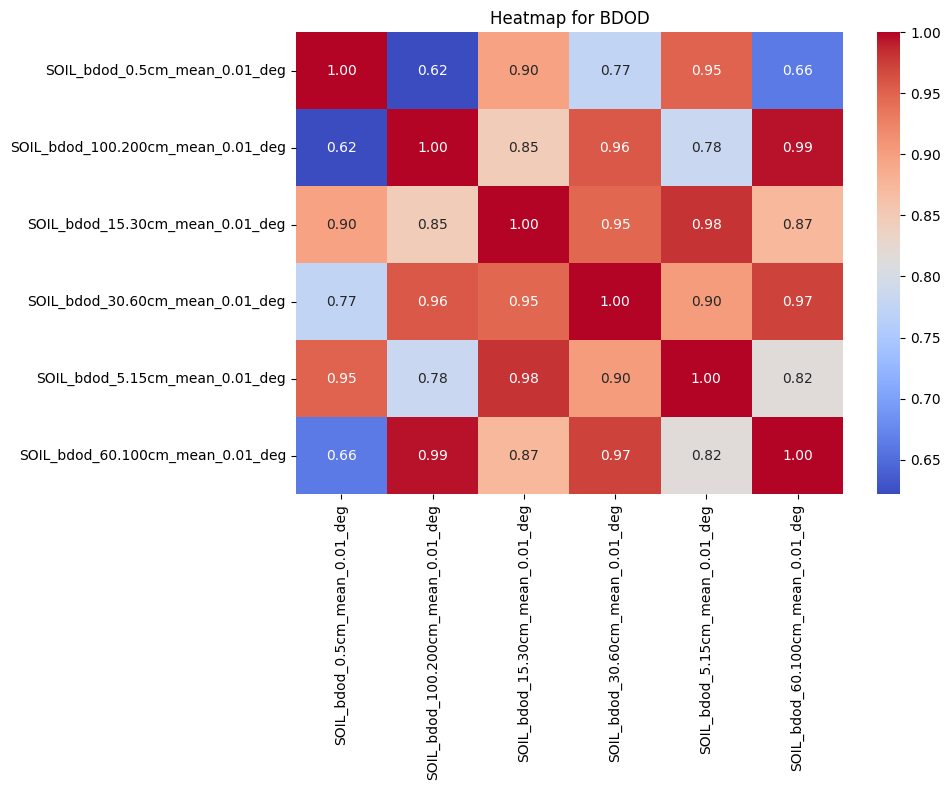

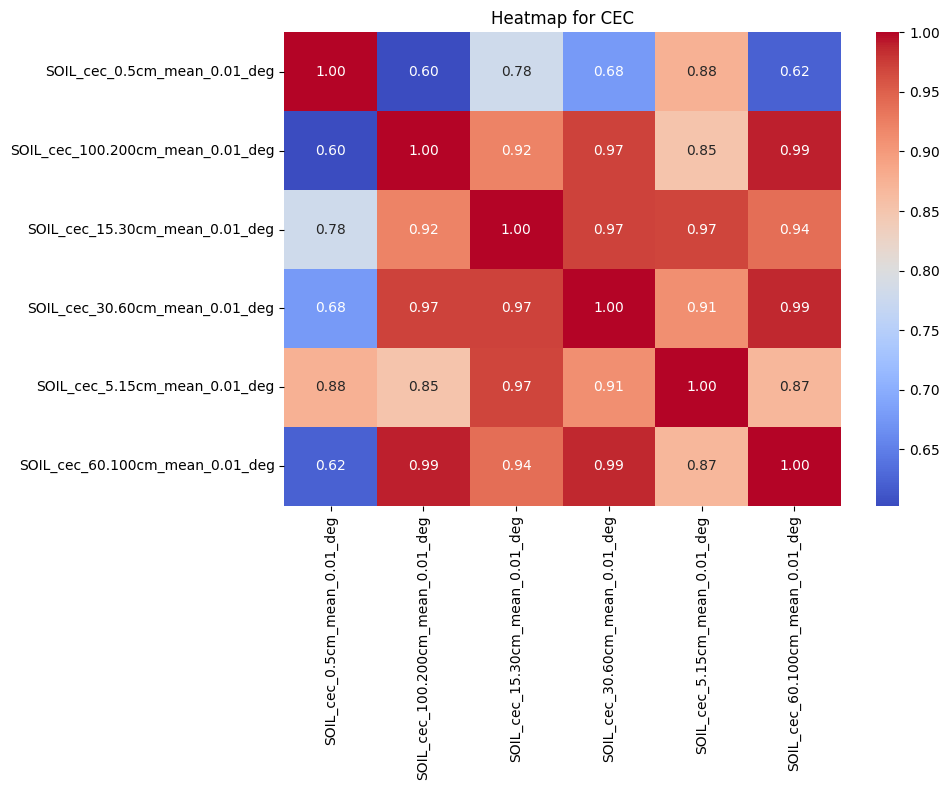

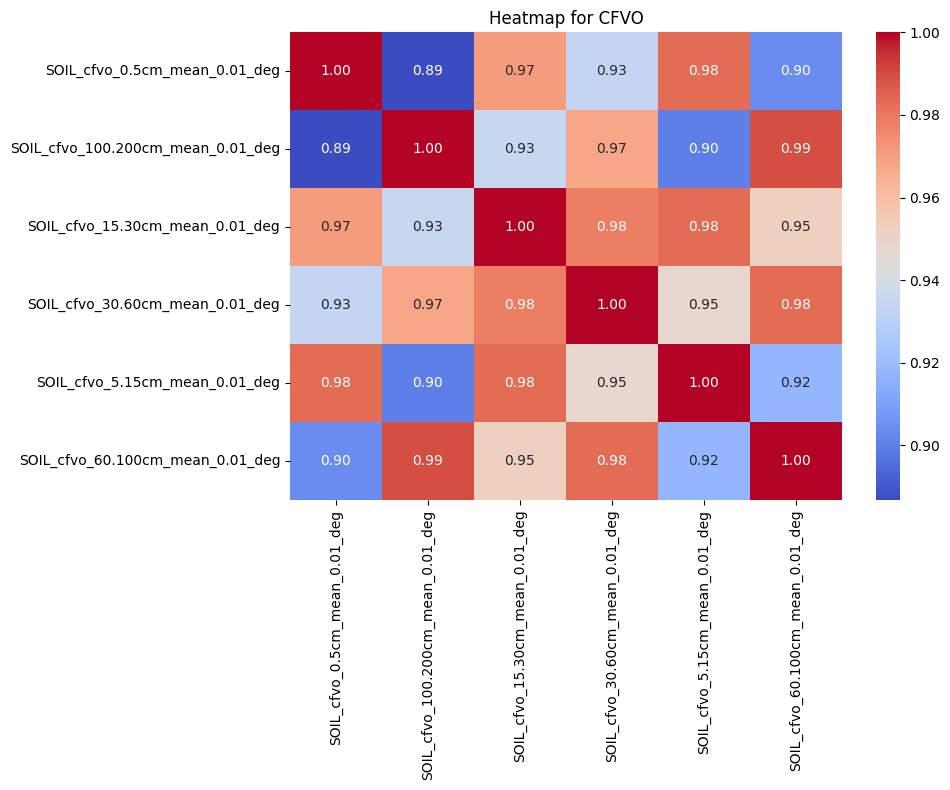

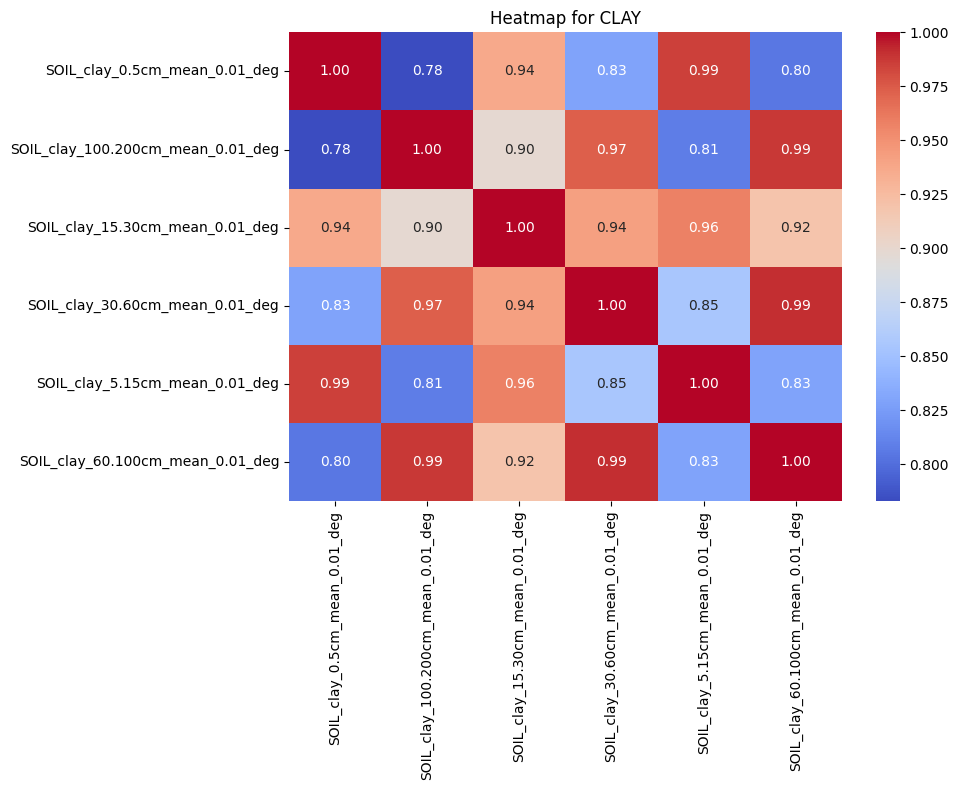

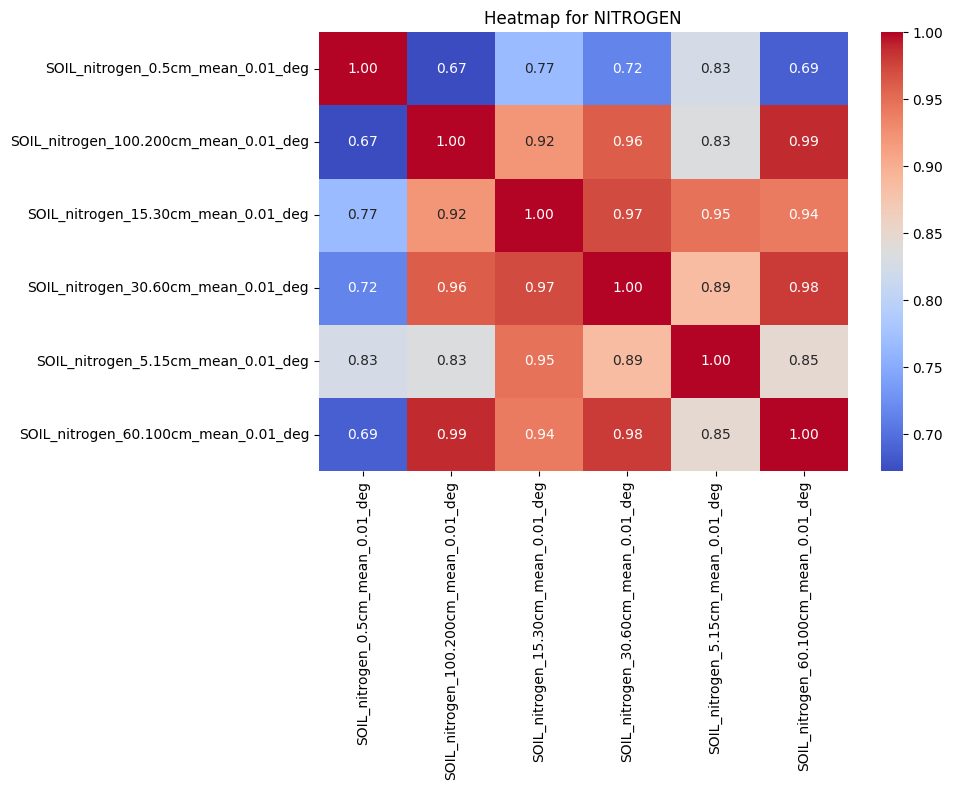

...

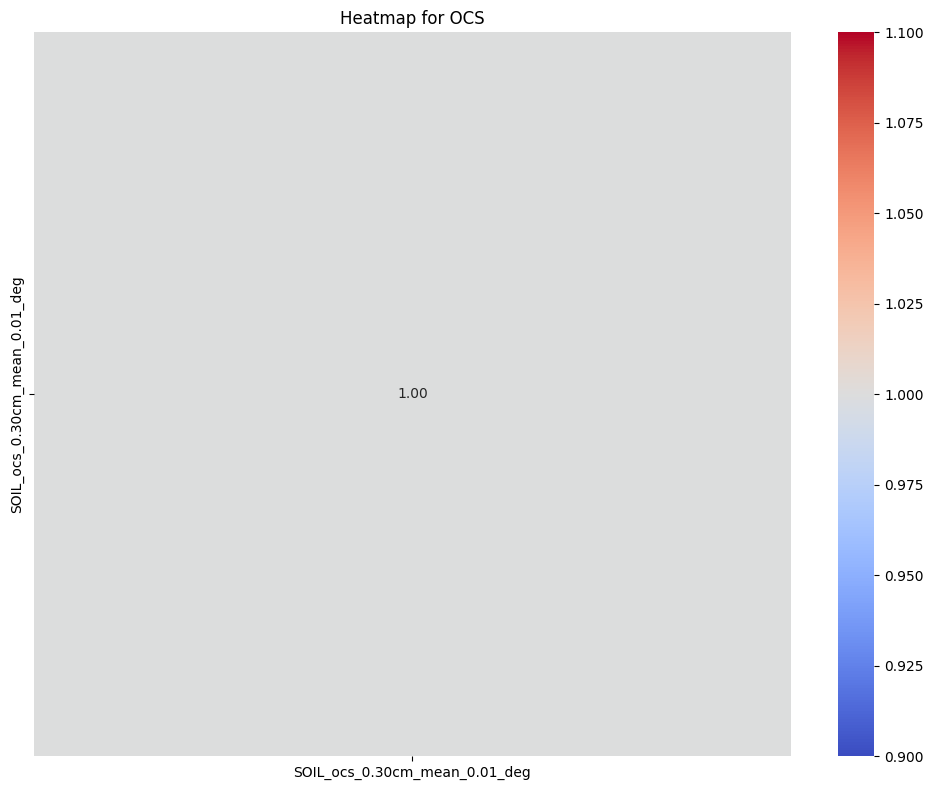

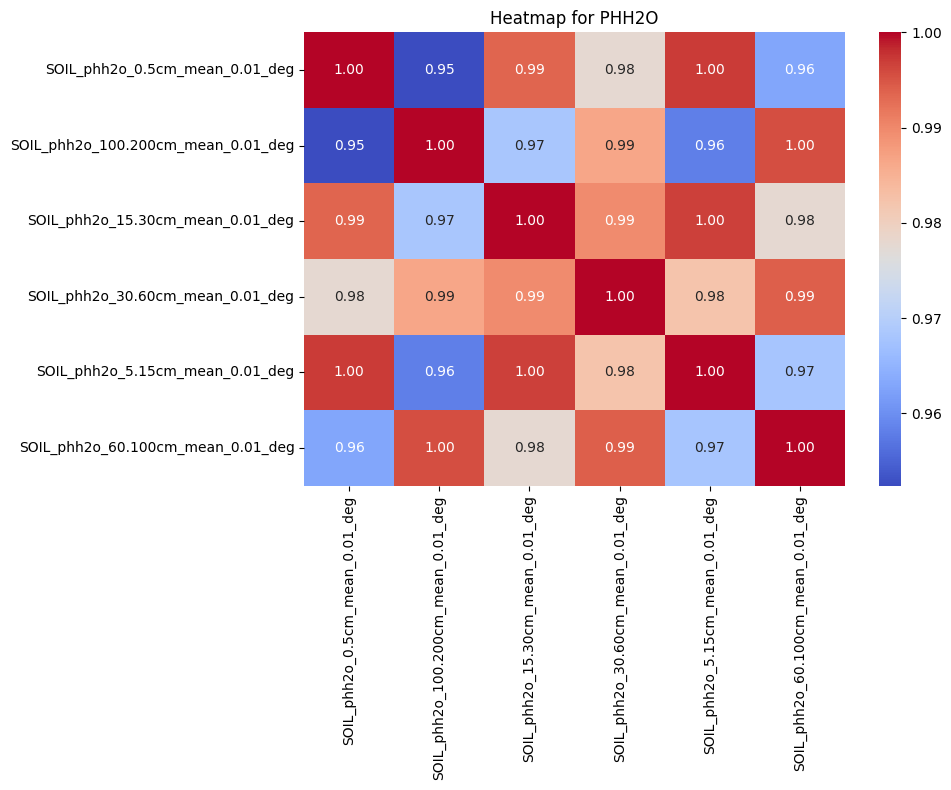

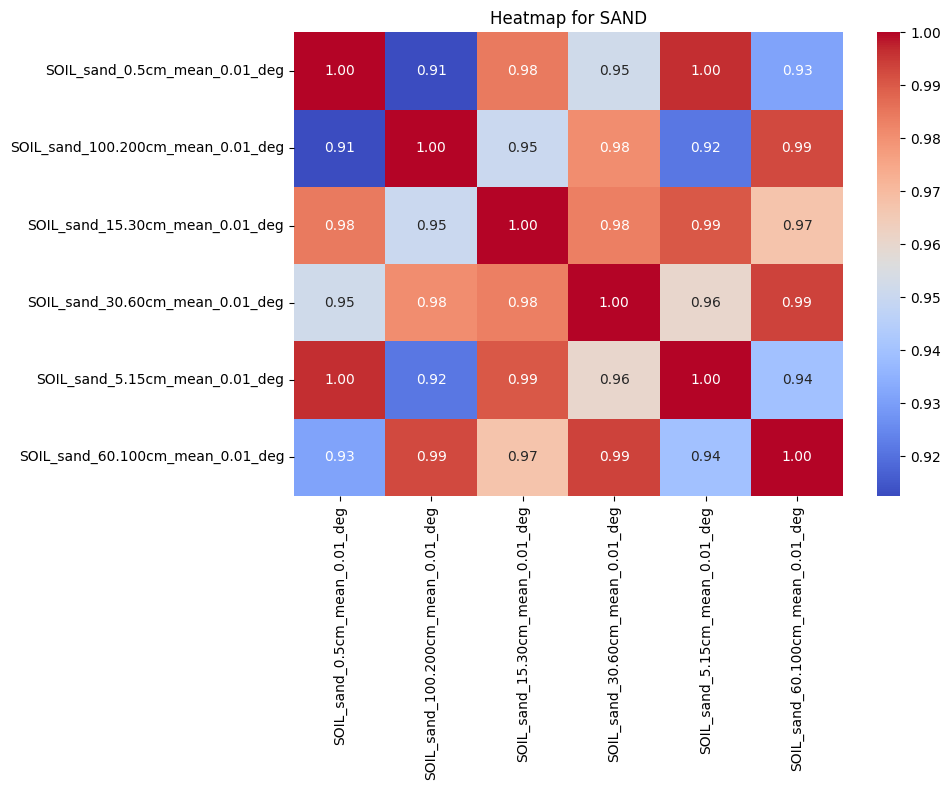

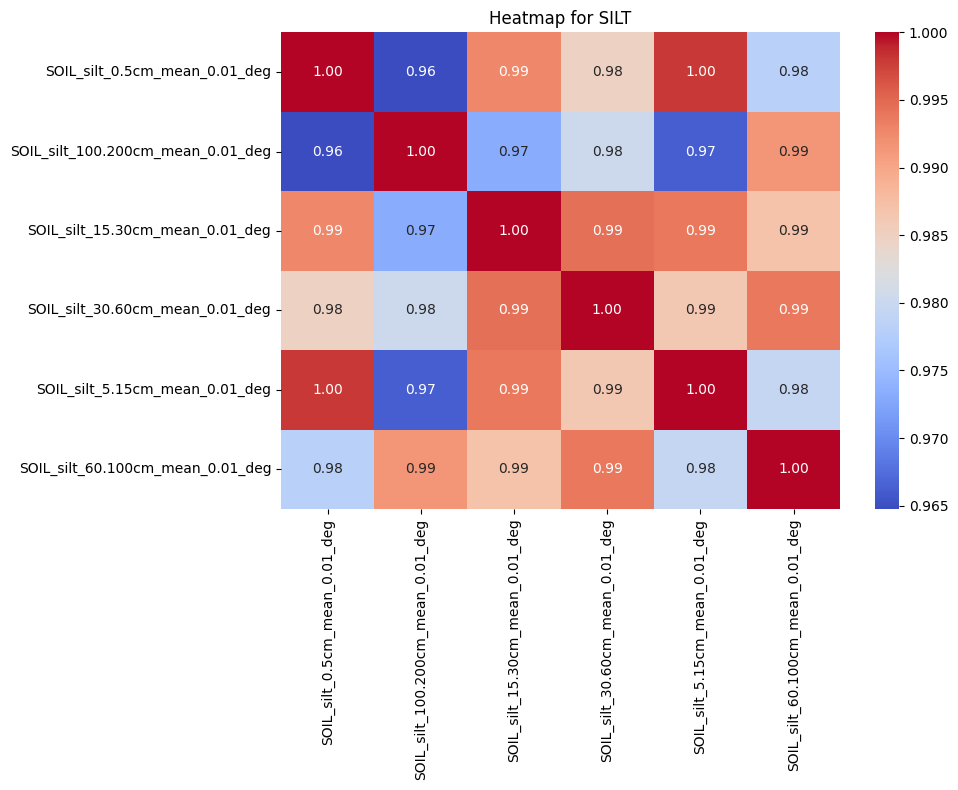

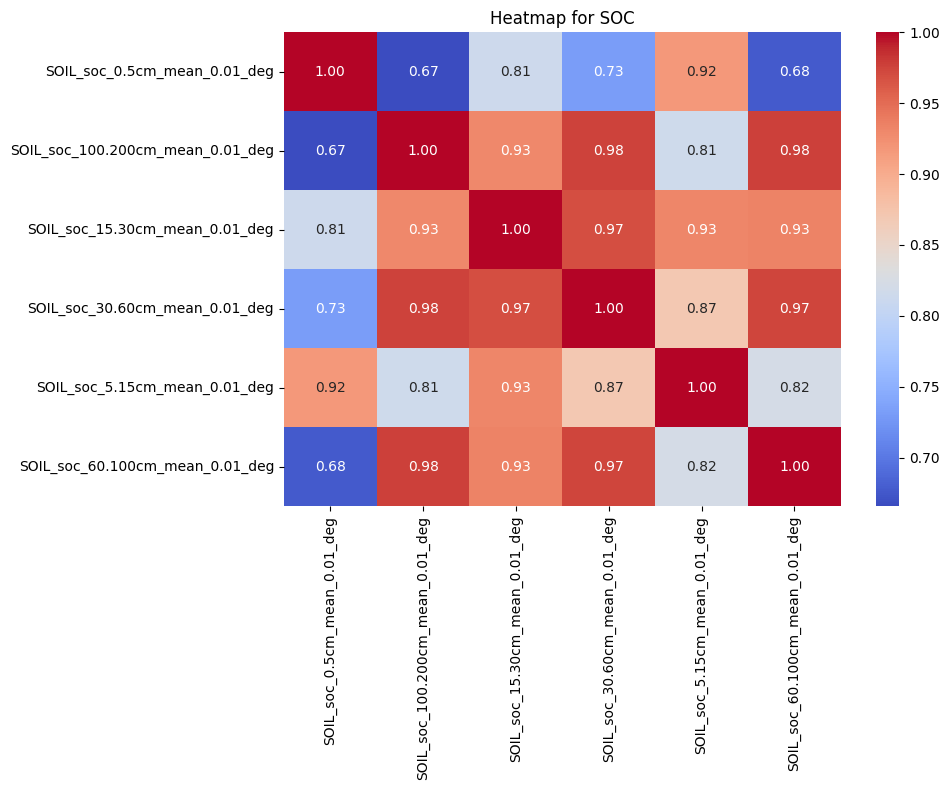

- bdod_df
- cec_df
- cfvo_df
- clay_df
- nitrogen_df
- ocd_df
- ocs_df
- phh2o_df
- sand_df
- silt_df
- soc_df


In [ ]:
soil_train_columns = soil_train.columns

# Create a DataFrame for properties
soil_train_df = pd.DataFrame({'Variable': soil_train_columns})

# Extract the property name from the variable
soil_train_df['Property'] = soil_train_df['Variable'].apply(lambda x: x.split('_')[1])

# Create separate DataFrames for each property and name them dynamically
for prop in soil_train_df['Property'].unique():
    vars_for_prop = soil_train_df[soil_train_df['Property'] == prop]['Variable'].tolist()
    globals()[f"{prop}_df"] = soil_train[vars_for_prop]

    # Generate a heatmap for the property
    plt.figure(figsize=(10, 8))
    sns.heatmap(globals()[f"{prop}_df"].corr(), annot=True, cmap="coolwarm", fmt=".2f", cbar=True)
    plt.title(f"Heatmap for {prop.upper()}")
    plt.tight_layout()
    plt.show()

# List the created DataFrames
for prop in soil_train_df['Property'].unique():
    print(f"- {prop}_df")

##### SOIL_bdod: Bulk density of the soil (fine earth fraction), measured in g/cm³.
##### SOIL_cec: Cation exchange capacity, which measures the soil's ability to hold exchangeable cations, in cmol(+)/kg.
##### SOIL_cfvo: Coarse fragments by volume, expressed as a percentage.
##### SOIL_clay: Clay content as a percentage of soil mass.
##### SOIL_nitrogen: Total nitrogen content in the soil, in g/kg.
##### SOIL_ocd: Organic carbon density, measured in g/cm³.
##### SOIL_ocs: Organic carbon stock, measured in t/ha.
##### SOIL_phh2o: pH in water (acidity/alkalinity).
##### SOIL_sand: Sand content as a percentage of soil mass.
##### SOIL_silt: Silt content as a percentage of soil mass.
##### SOIL_soc: Soil organic carbon content, measured in g/kg.

### 0.5 cm

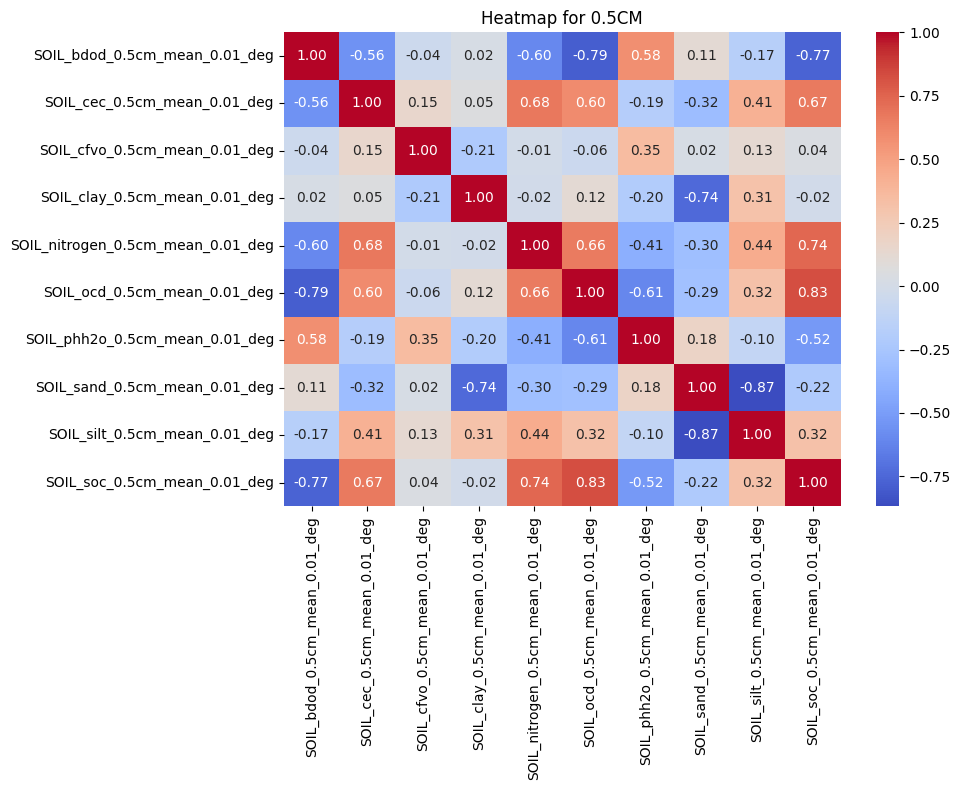

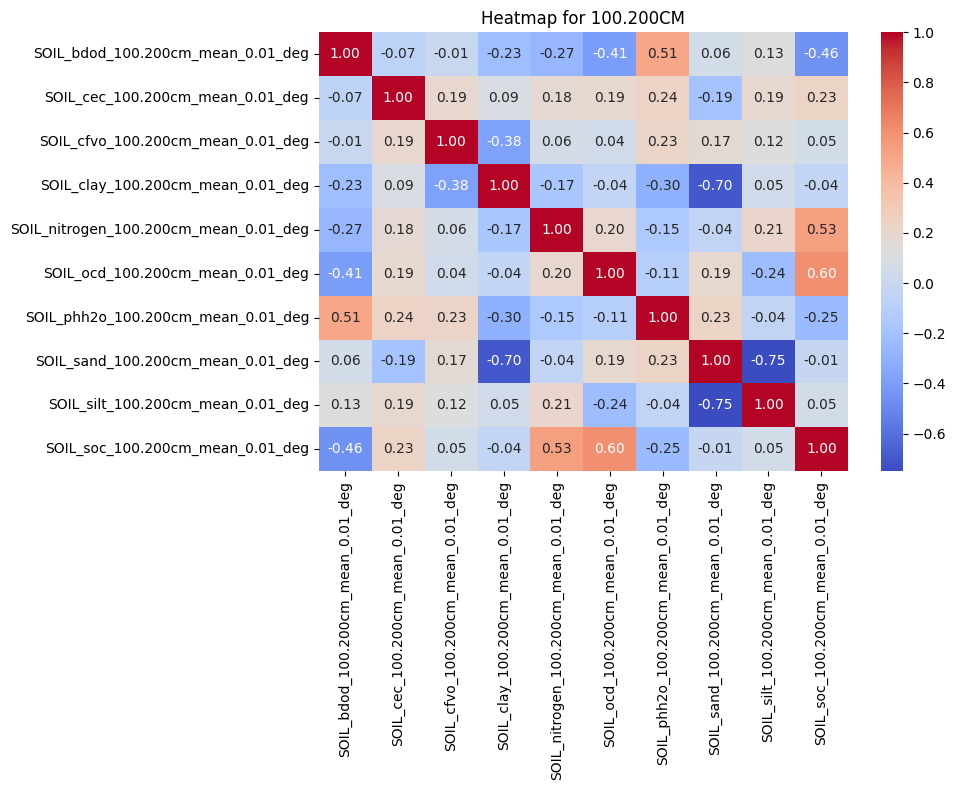

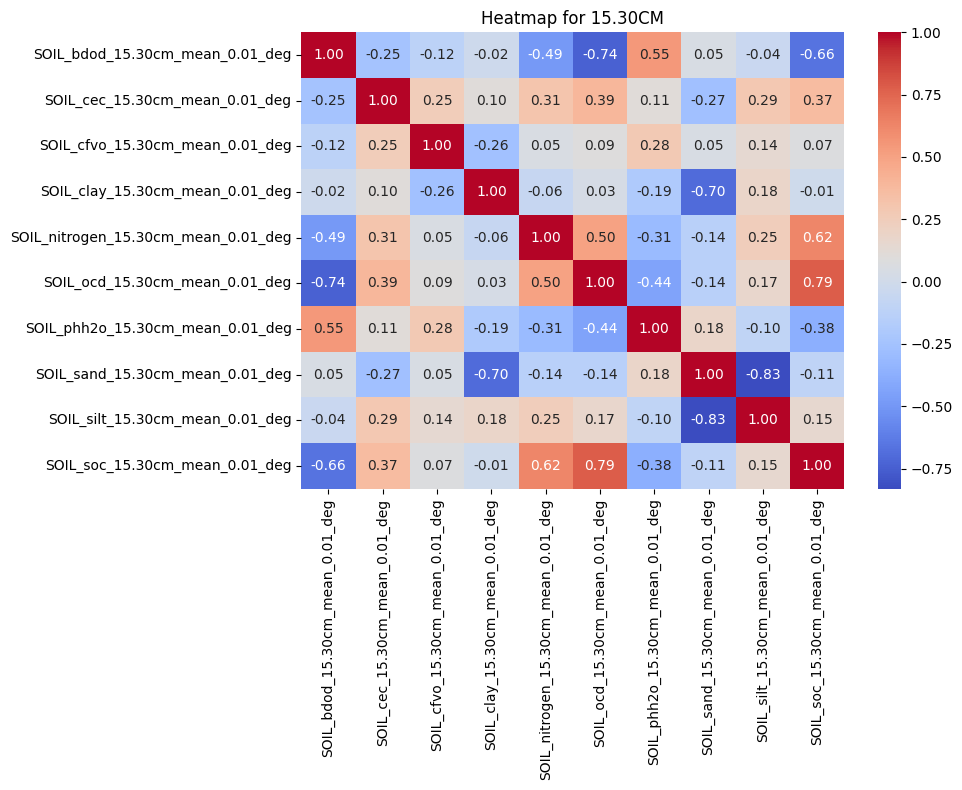

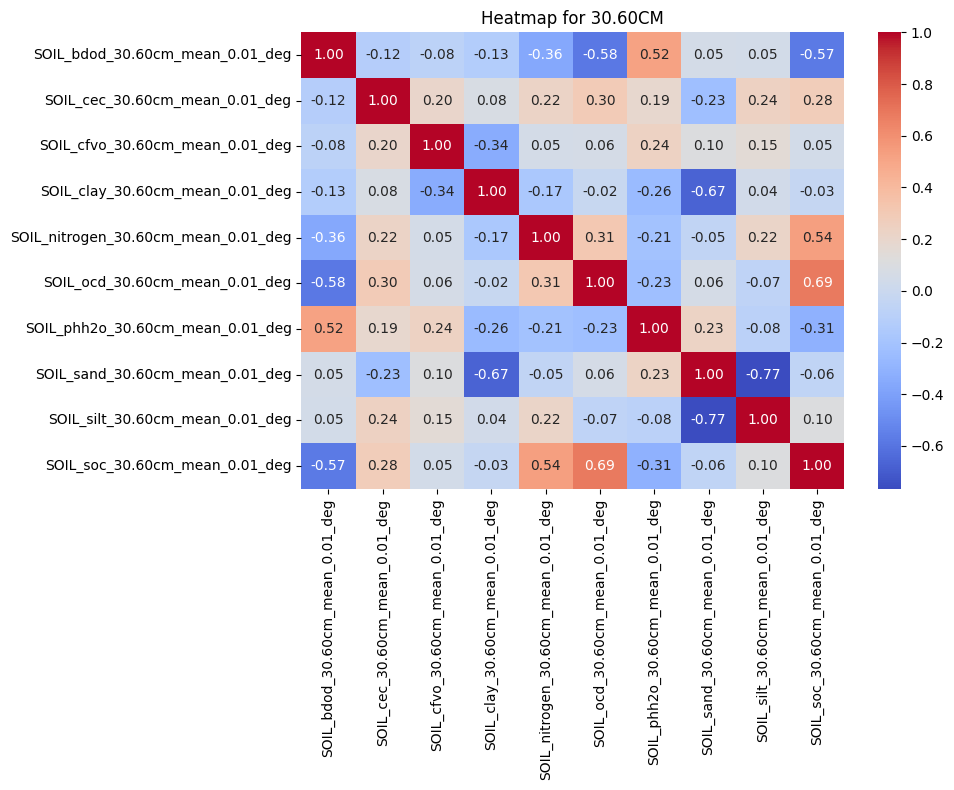

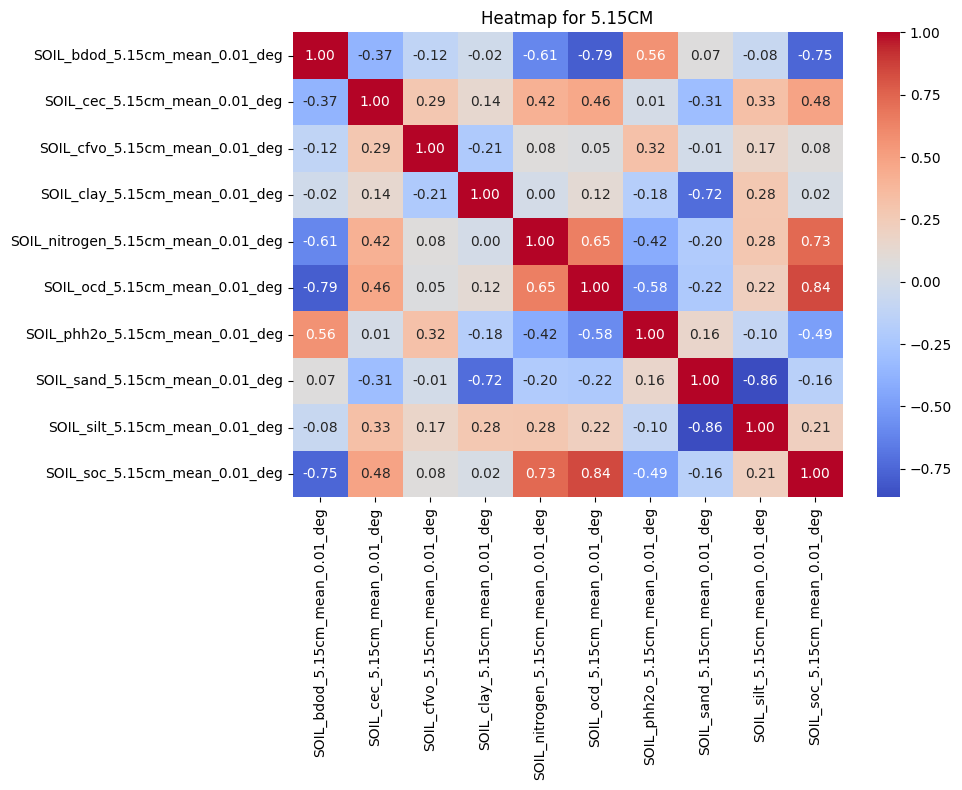

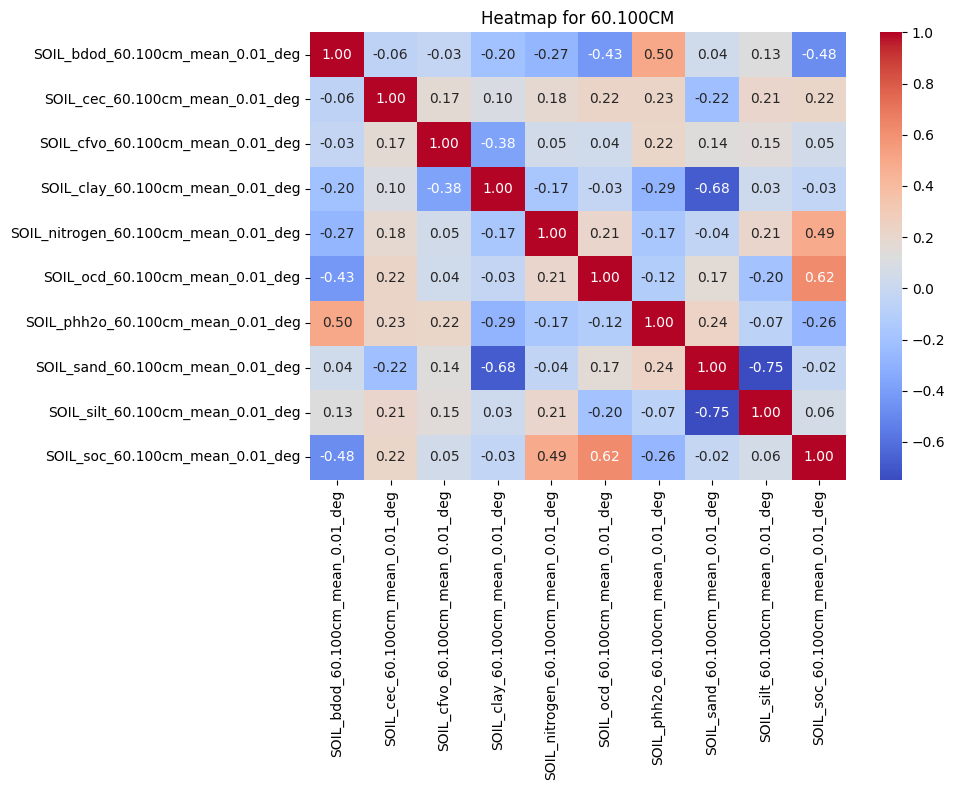

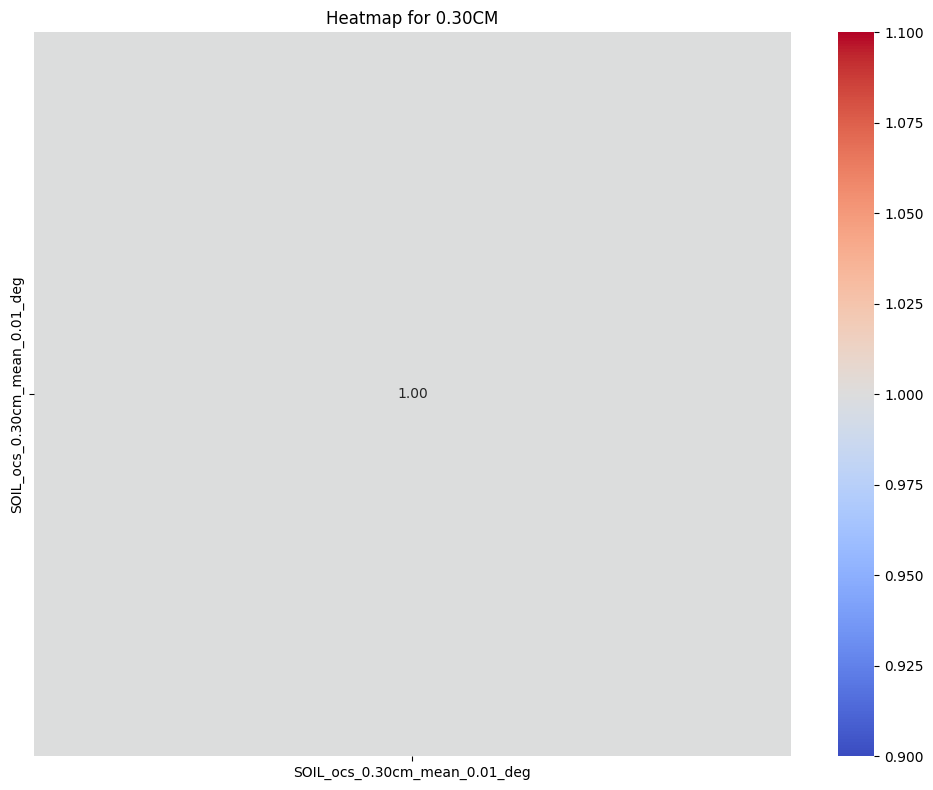

- 0.5cm_df
- 100.200cm_df
- 15.30cm_df
- 30.60cm_df
- 5.15cm_df
- 60.100cm_df
- 0.30cm_df


In [16]:
soil_train_columns = soil_train.columns

# Create a DataFrame for properties
soil_train_df = pd.DataFrame({'Variable': soil_train_columns})

# Extract the property name from the variable
soil_train_df['Depth'] = soil_train_df['Variable'].apply(lambda x: x.split('_')[2])

# Create separate DataFrames for each property and name them dynamically
for prop in soil_train_df['Depth'].unique():
    vars_for_prop = soil_train_df[soil_train_df['Depth'] == prop]['Variable'].tolist()
    globals()[f"{prop}_df"] = soil_train[vars_for_prop]

    # Generate a heatmap for the property
    plt.figure(figsize=(10, 8))
    sns.heatmap(globals()[f"{prop}_df"].corr(), annot=True, cmap="coolwarm", fmt=".2f", cbar=True)
    plt.title(f"Heatmap for {prop.upper()}")
    plt.tight_layout()
    plt.show()

# List the created DataFrames
for prop in soil_train_df['Depth'].unique():
    print(f"- {prop}_df")

## Missing values

In [19]:
soil_train.isnull().sum().sort_values(ascending=False).head(5)

SOIL_bdod_0.5cm_mean_0.01_deg       0
SOIL_ocd_100.200cm_mean_0.01_deg    0
SOIL_ocd_30.60cm_mean_0.01_deg      0
SOIL_ocd_5.15cm_mean_0.01_deg       0
SOIL_ocd_60.100cm_mean_0.01_deg     0
dtype: int64

In [20]:
soil_test.isnull().sum().sort_values(ascending=False).head(5)

SOIL_bdod_0.5cm_mean_0.01_deg       0
SOIL_ocd_100.200cm_mean_0.01_deg    0
SOIL_ocd_30.60cm_mean_0.01_deg      0
SOIL_ocd_5.15cm_mean_0.01_deg       0
SOIL_ocd_60.100cm_mean_0.01_deg     0
dtype: int64

## Duplicates 

In [21]:
soil_train.duplicated().sum()

18527

In [22]:
soil_test.duplicated().sum()

1223

In [23]:
soil_train[soil_train.duplicated()]

,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,SOIL_bdod_5.15cm_mean_0.01_deg,SOIL_bdod_60.100cm_mean_0.01_deg,SOIL_cec_0.5cm_mean_0.01_deg,SOIL_cec_100.200cm_mean_0.01_deg,SOIL_cec_15.30cm_mean_0.01_deg,SOIL_cec_30.60cm_mean_0.01_deg,...,SOIL_silt_15.30cm_mean_0.01_deg,SOIL_silt_30.60cm_mean_0.01_deg,SOIL_silt_5.15cm_mean_0.01_deg,SOIL_silt_60.100cm_mean_0.01_deg,SOIL_soc_0.5cm_mean_0.01_deg,SOIL_soc_100.200cm_mean_0.01_deg,SOIL_soc_15.30cm_mean_0.01_deg,SOIL_soc_30.60cm_mean_0.01_deg,SOIL_soc_5.15cm_mean_0.01_deg,SOIL_soc_60.100cm_mean_0.01_deg
251,125,144,136,141,131,143,155,131,130,131,...,201,201,217,204,257,33,125,68,168,40
292,109,152,128,146,122,151,285,221,257,236,...,340,335,345,324,725,205,264,214,515,184
447,141,158,155,157,147,159,217,218,210,214,...,195,182,197,177,303,18,95,52,142,28
484,111,133,125,130,119,131,198,231,244,244,...,188,194,211,191,204,145,150,117,149,141
537,143,171,153,167,152,170,164,138,147,149,...,260,269,265,270,352,75,204,137,185,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55481,119,128,122,126,121,127,158,117,127,119,...,213,213,227,215,321,43,162,94,251,59
55483,108,136,122,131,114,136,244,174,190,191,...,176,165,182,168,508,35,123,67,245,39
55484,118,140,131,136,125,138,157,157,144,145,...,88,89,90,82,232,72,129,82,147,60
55486,118,155,136,146,131,152,200,165,163,161,...,254,243,259,233,494,31,140,71,268,46


In [56]:
soil_train.columns

Index(['SOIL_bdod_0.5cm_mean_0.01_deg', 'SOIL_bdod_100.200cm_mean_0.01_deg',
       'SOIL_bdod_15.30cm_mean_0.01_deg', 'SOIL_bdod_30.60cm_mean_0.01_deg',
       'SOIL_bdod_5.15cm_mean_0.01_deg', 'SOIL_bdod_60.100cm_mean_0.01_deg',
       'SOIL_cec_0.5cm_mean_0.01_deg', 'SOIL_cec_100.200cm_mean_0.01_deg',
       'SOIL_cec_15.30cm_mean_0.01_deg', 'SOIL_cec_30.60cm_mean_0.01_deg',
       'SOIL_cec_5.15cm_mean_0.01_deg', 'SOIL_cec_60.100cm_mean_0.01_deg',
       'SOIL_cfvo_0.5cm_mean_0.01_deg', 'SOIL_cfvo_100.200cm_mean_0.01_deg',
       'SOIL_cfvo_15.30cm_mean_0.01_deg', 'SOIL_cfvo_30.60cm_mean_0.01_deg',
       'SOIL_cfvo_5.15cm_mean_0.01_deg', 'SOIL_cfvo_60.100cm_mean_0.01_deg',
       'SOIL_clay_0.5cm_mean_0.01_deg', 'SOIL_clay_100.200cm_mean_0.01_deg',
       'SOIL_clay_15.30cm_mean_0.01_deg', 'SOIL_clay_30.60cm_mean_0.01_deg',
       'SOIL_clay_5.15cm_mean_0.01_deg', 'SOIL_clay_60.100cm_mean_0.01_deg',
       'SOIL_nitrogen_0.5cm_mean_0.01_deg',
       'SOIL_nitrogen_100.200cm_mean_0

In [39]:
train_data.duplicated().sum()

0

In [40]:
test_data.duplicated().sum()

0

## Stats

In [24]:
def describe_df(df):
    df_described = df.describe()
    df_described.loc['skew'] = skew(df)
    df_described.loc['kurtosis'] = kurtosis(df)
    df_described.loc['variance'] = df.var()
    df_described.loc['mode'] = df.mode().iloc[0]

    return df_described

In [25]:
describe_df(soil_train).T

,count,mean,std,min,25%,50%,75%,max,skew,kurtosis,variance,mode
SOIL_bdod_0.5cm_mean_0.01_deg,55489.0,116.895673,17.607857,29.0,106.0,118.0,130.0,194.0,-0.315472,-0.115624,310.036639,113.0
SOIL_bdod_100.200cm_mean_0.01_deg,55489.0,140.259205,15.075214,46.0,131.0,142.0,150.0,192.0,-0.311315,0.390183,227.262090,146.0
SOIL_bdod_15.30cm_mean_0.01_deg,55489.0,128.187695,16.030602,42.0,118.0,129.0,139.0,201.0,-0.307081,0.060594,256.980215,132.0
SOIL_bdod_30.60cm_mean_0.01_deg,55489.0,135.103624,15.609636,45.0,126.0,137.0,145.0,185.0,-0.425429,0.372159,243.660722,138.0
SOIL_bdod_5.15cm_mean_0.01_deg,55489.0,123.118222,16.641816,40.0,112.0,123.0,135.0,204.0,-0.224426,-0.198540,276.950052,123.0
...,...,...,...,...,...,...,...,...,...,...,...,...
SOIL_soc_100.200cm_mean_0.01_deg,55489.0,155.326209,210.491309,3.0,47.0,87.0,180.0,4350.0,4.635570,37.163218,44306.591268,41.0
SOIL_soc_15.30cm_mean_0.01_deg,55489.0,265.789219,243.784330,11.0,128.0,200.0,308.0,3298.0,3.395802,17.185250,59430.799573,161.0
SOIL_soc_30.60cm_mean_0.01_deg,55489.0,192.896826,206.664374,5.0,81.0,132.0,223.0,4114.0,4.205535,30.590917,42710.163429,73.0
SOIL_soc_5.15cm_mean_0.01_deg,55489.0,382.845933,308.163242,-189.0,186.0,305.0,471.0,3460.0,2.420399,8.852307,94964.583548,141.0


In [26]:
describe_df(soil_test).T

,count,mean,std,min,25%,50%,75%,max,skew,kurtosis,variance,mode
SOIL_bdod_0.5cm_mean_0.01_deg,6545.0,115.637892,18.500107,44.0,104.0,117.0,129.0,160.0,-0.359118,-0.193416,342.253943,125.0
SOIL_bdod_100.200cm_mean_0.01_deg,6545.0,141.002903,15.432760,56.0,131.0,143.0,152.0,188.0,-0.479169,0.289477,238.170071,149.0
SOIL_bdod_15.30cm_mean_0.01_deg,6545.0,127.907105,16.717081,46.0,118.0,129.0,140.0,174.0,-0.383711,-0.064956,279.460807,131.0
SOIL_bdod_30.60cm_mean_0.01_deg,6545.0,135.385943,16.244423,54.0,126.0,138.0,146.0,180.0,-0.576366,0.279206,263.881282,146.0
SOIL_bdod_5.15cm_mean_0.01_deg,6545.0,122.638808,17.315779,43.0,111.0,123.0,136.0,169.0,-0.274293,-0.312510,299.836208,122.0
...,...,...,...,...,...,...,...,...,...,...,...,...
SOIL_soc_100.200cm_mean_0.01_deg,6545.0,176.735065,252.619950,7.0,47.0,87.0,193.0,2422.0,3.450571,14.189700,63816.839029,41.0
SOIL_soc_15.30cm_mean_0.01_deg,6545.0,295.345149,298.537978,18.0,136.0,203.0,326.0,2670.0,3.182427,12.696863,89124.924100,150.0
SOIL_soc_30.60cm_mean_0.01_deg,6545.0,214.745149,247.887277,13.0,84.0,135.0,235.0,2323.0,3.322756,13.496392,61448.102217,67.0
SOIL_soc_5.15cm_mean_0.01_deg,6545.0,422.797708,367.255684,22.0,203.0,313.0,502.0,3347.0,2.417229,7.511185,134876.737189,214.0


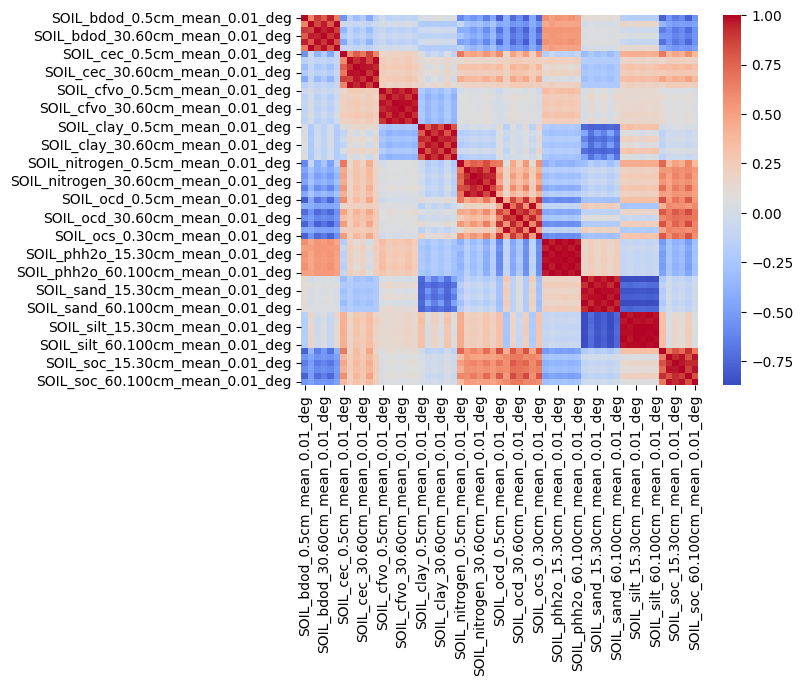

In [27]:
sns.heatmap(soil_train.corr(), cmap = 'coolwarm');

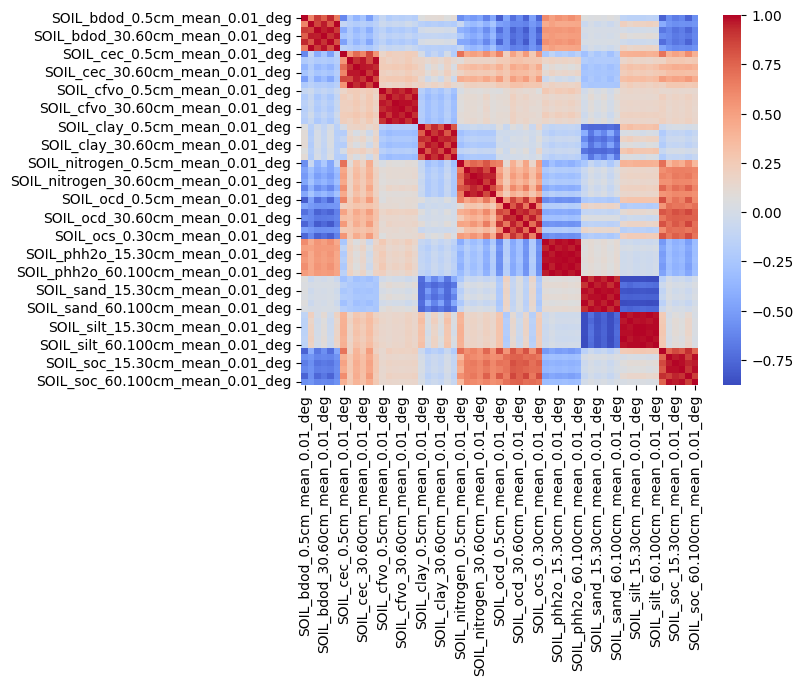

In [28]:
sns.heatmap(soil_test.corr(), cmap = 'coolwarm');

/var/folders/sm/vy1p0pvx0_xcgnggryx_11p80000gn/T/ipykernel_50603/108330235.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,3,figsize=(15,5))


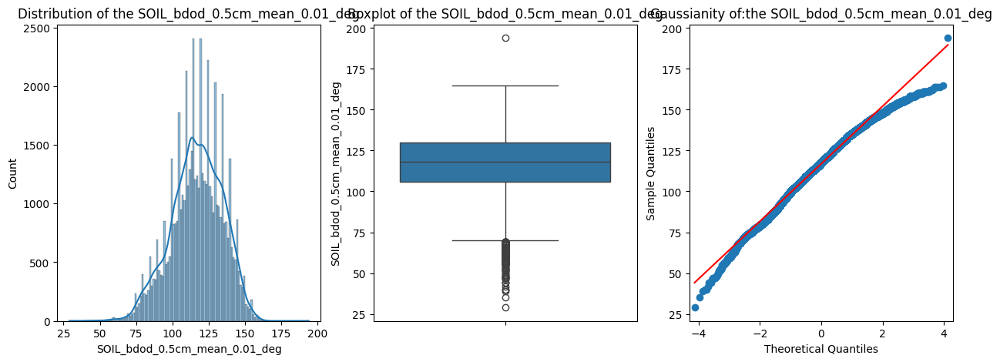

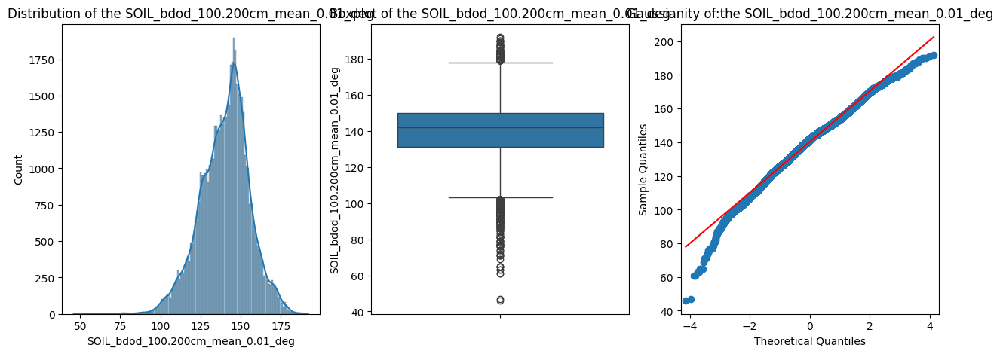

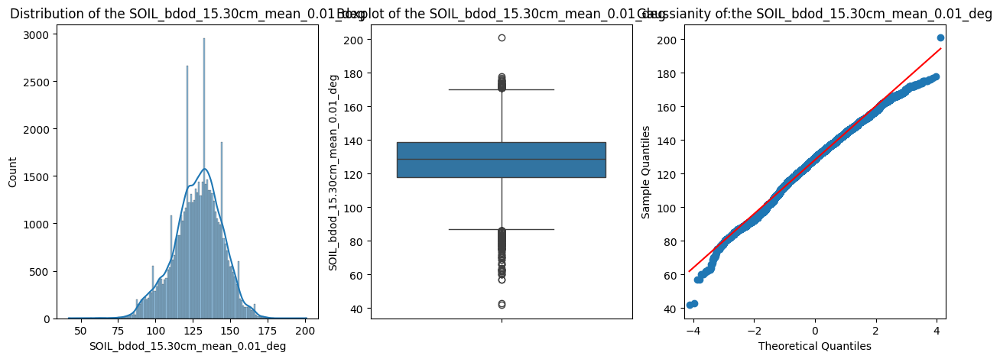

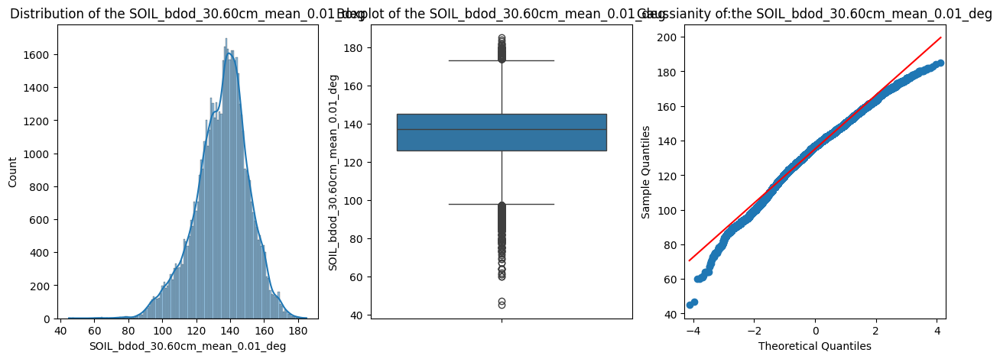

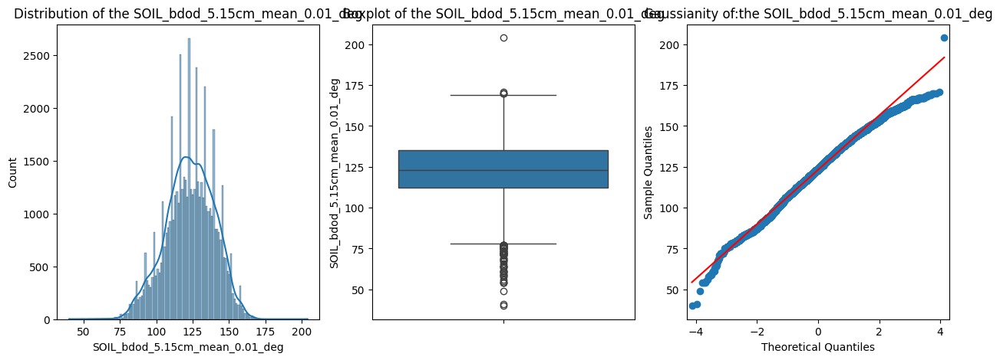

...

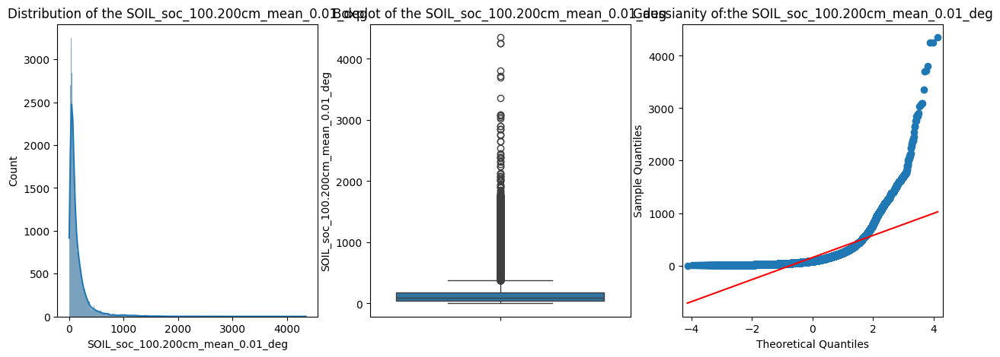

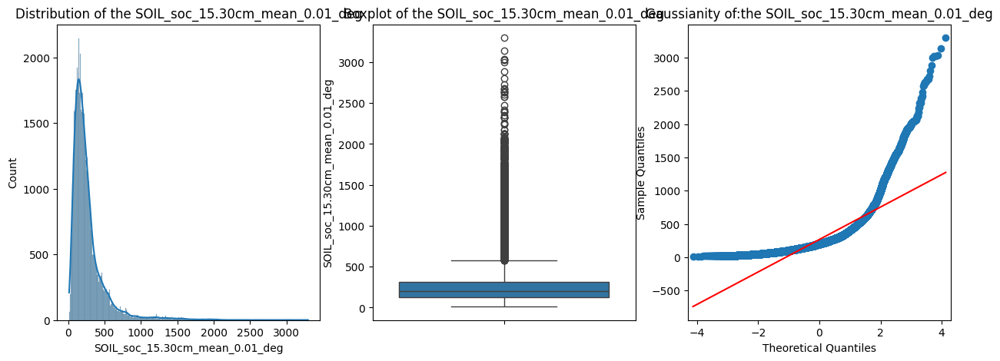

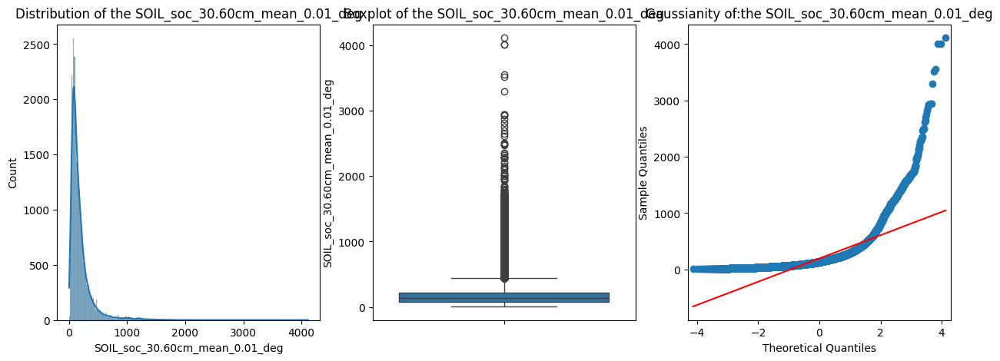

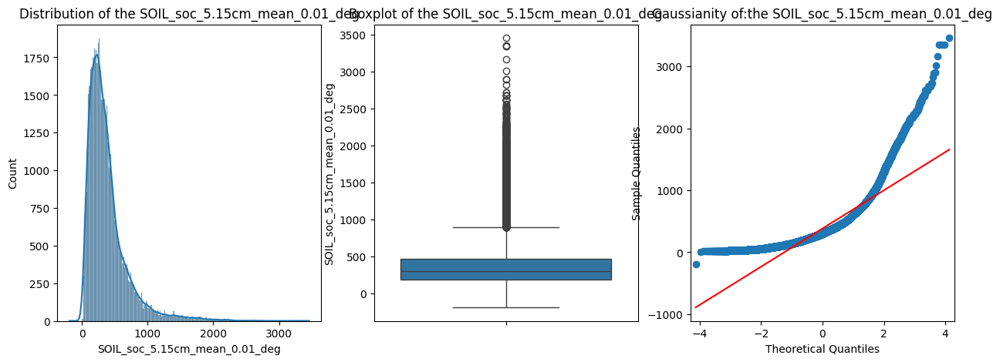

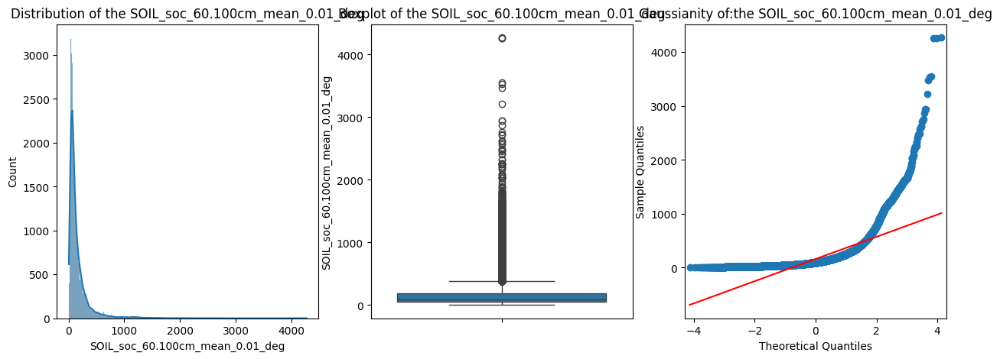

In [21]:
for feature in soil_train.columns:
    variable = feature

    fig, ax = plt.subplots(1,3,figsize=(15,5))

    ax[0].set_title(f"Distribution of the {variable}")
    sns.histplot(data = soil_train[f"{variable}"], kde=True, ax = ax[0])

    ax[1].set_title(f"Boxplot of the {variable}")
    sns.boxplot(data = soil_train[f"{variable}"], ax=ax[1])

    ax[2].set_title(f"Gaussianity of:the {variable}")
    qqplot(soil_train[f"{variable}"],line='s',ax=ax[2]);

/var/folders/sm/vy1p0pvx0_xcgnggryx_11p80000gn/T/ipykernel_50603/1934480191.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,3,figsize=(15,5))


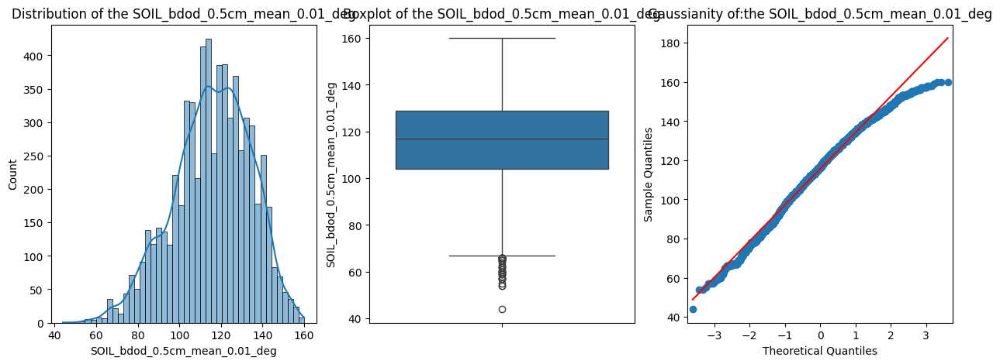

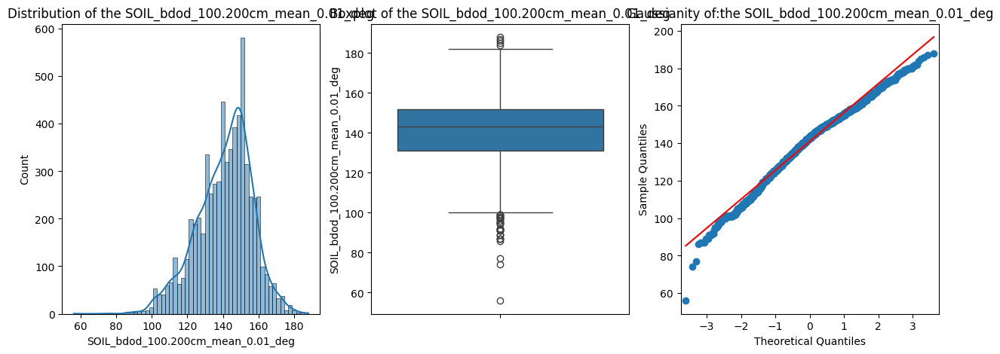

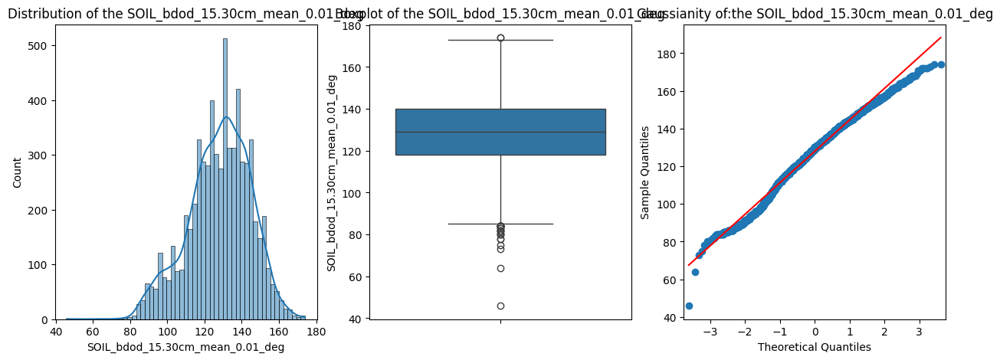

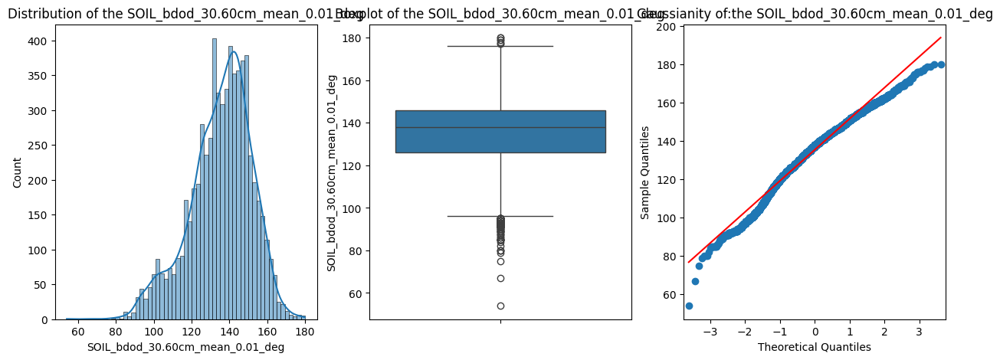

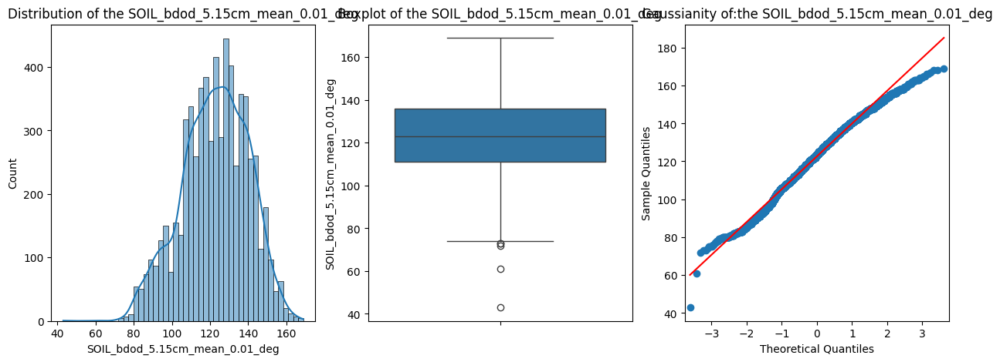

...

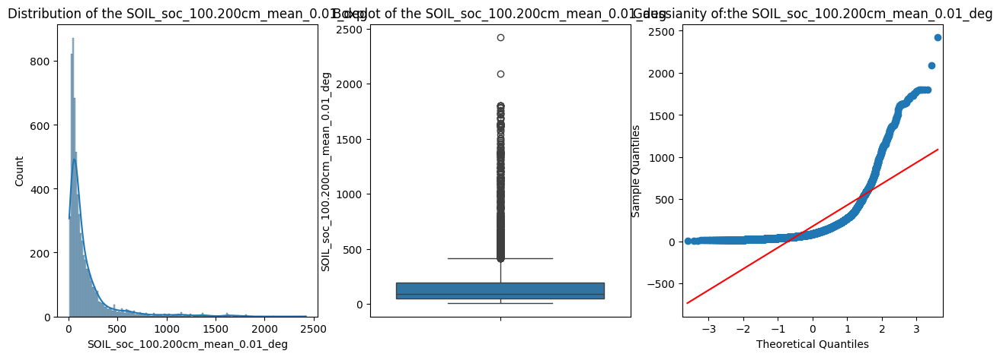

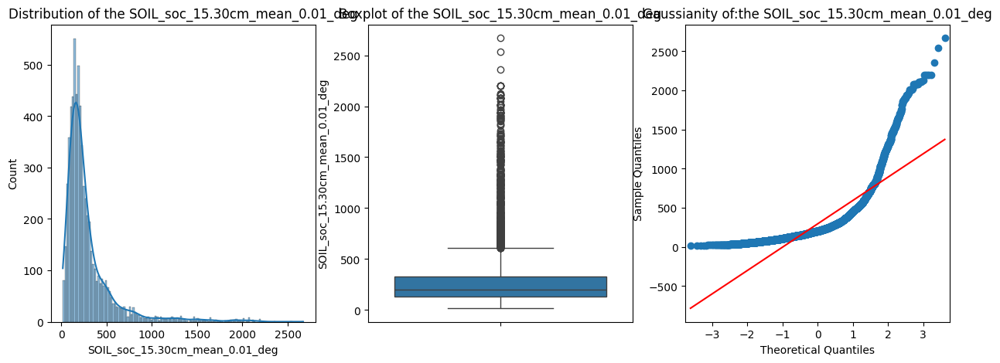

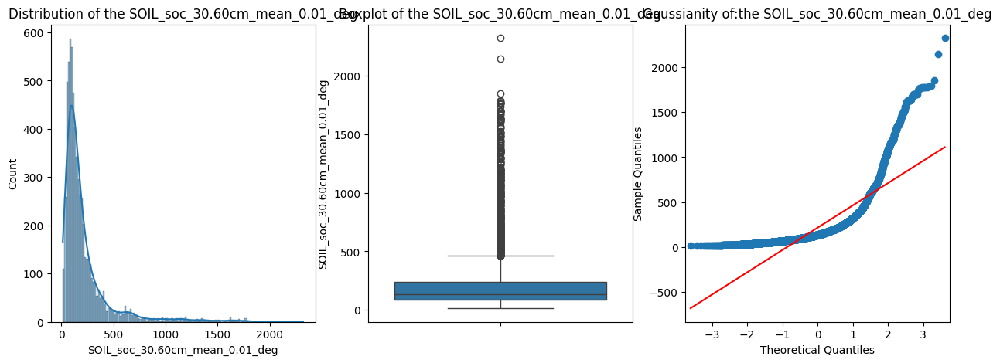

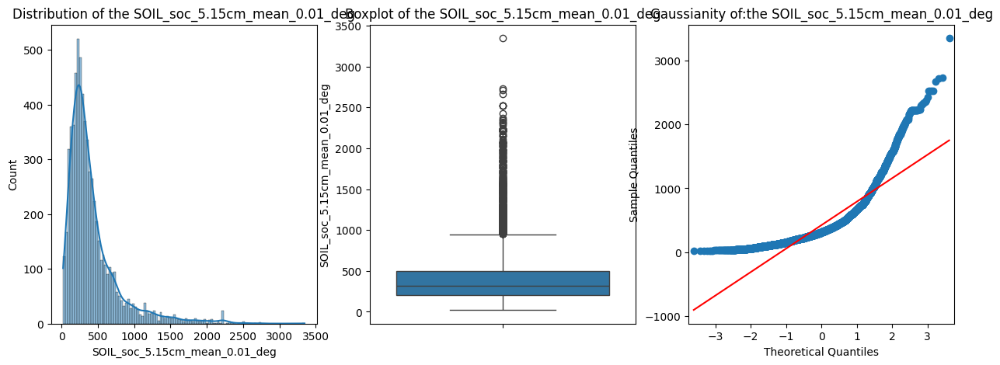

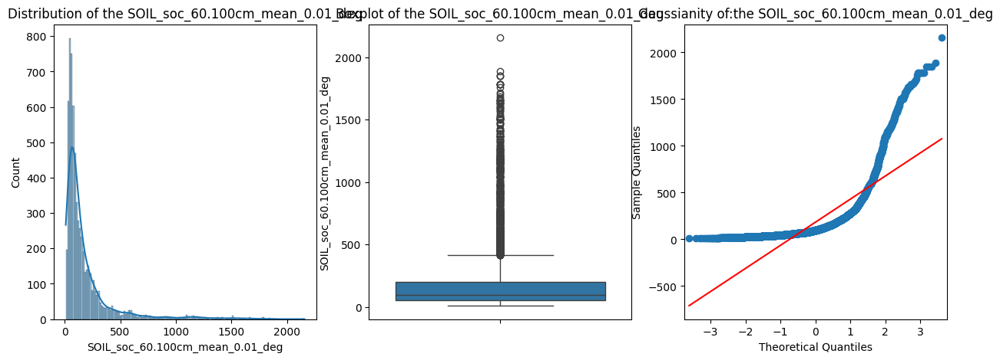

In [22]:
for feature in soil_test.columns:
    variable = feature

    fig, ax = plt.subplots(1,3,figsize=(15,5))

    ax[0].set_title(f"Distribution of the {variable}")
    sns.histplot(data = soil_test[f"{variable}"], kde=True, ax = ax[0])

    ax[1].set_title(f"Boxplot of the {variable}")
    sns.boxplot(data = soil_test[f"{variable}"], ax=ax[1])

    ax[2].set_title(f"Gaussianity of:the {variable}")
    qqplot(soil_test[f"{variable}"],line='s',ax=ax[2]);

# Preprocessing

In [ ]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
preproc_soil_train = scaler.fit_transform(soil_train)
preproc_soil_train

In [29]:
from sklearn.preprocessing import RobustScaler

In [30]:
scaler = RobustScaler()

In [31]:
preproc_soil_train = scaler.fit_transform(soil_train)

In [32]:
preproc_soil_train

array([[ 0.29166667,  0.36842105,  0.33333333, ..., -0.26760563,
        -0.34035088, -0.44186047],
       [ 0.25      ,  0.10526316,  0.42857143, ..., -0.77464789,
        -0.89473684, -0.58139535],
       [-0.45833333, -0.47368421, -0.47619048, ...,  1.24647887,
         0.69824561,  1.24031008],
       ...,
       [ 0.        ,  0.68421053,  0.33333333, ..., -0.42957746,
        -0.12982456, -0.37984496],
       [-0.375     , -0.63157895, -0.57142857, ...,  0.31690141,
         0.13333333, -0.03875969],
       [ 0.25      , -0.36842105,  0.0952381 , ..., -0.06338028,
        -0.15087719,  0.02325581]])